<a href="https://colab.research.google.com/github/PavithraKudumula/hds5210-2023/blob/main/final/final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **HDS 5210 Final Project**

## **Introduction**
As a aspiring data scientist for this final project I have chosen to expand the Health insurance company.

Health insurance provides financial protection for people by covering all or a portion of their medical expenses that arise due to illness or injury. A health insurance company essentially pools the risks and costs of its members to provide this financial coverage against unpredictable health events. From both a social impact and business perspective, there is a significant need to progress health insurance to cover more people and provide affordable, quality coverage.

As a data scientist in the health insurance industry, I am keenly interested in leveraging data to improve all aspects of health insurance – expanding coverage, reducing costs, enhancing patient care, developing innovative products, and more. Some key areas I intend to focus on are:

Utilizing data on demographics, health expenditures, treatment costs, chronic conditions and more to develop pricing models and innovative insurance products tailored to currently underserved markets. This can expand access to affordable health insurance for more individuals.



## **Data Sources:**

Datsets 1 and 2 (Csv files):  
1. https://www.kaggle.com/datasets/thedevastator/demographic-trends-and-health-outcomes-in-the-u

Datasets 3 and 4:(xlsl files)
1. https://aspe.hhs.gov/sites/default/files/migrated_legacy_files//200101/aspe-uninsured-estimates-by-county.xlsx
2. https://www.ers.usda.gov/webdocs/DataFiles/48747/PovertyEstimates.xlsx?v=9662.9

# **# Imports**

```
# This is formatted as code
```



In [49]:
from google.colab import data_table
data_table.enable_dataframe_formatter()

In [50]:
!pip install geopandas matplotlib
import geopandas as gpd
!pip install plotly

In [51]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from google.colab import files
import numpy as np


## **Dataset-1 USA Demographics**

*   List item
*   List item


This dataset provides demographic and socioeconomic data at the county level for the state of Alabama.

Specifically, it contains variables like population size, density, age distribution, race/ethnicity composition, poverty rates, etc. for each county in AL.

With 37-53 data points per variable for each of Alabama's 67 counties, this dataset could help support analysis of factors impacting health insurance coverage rates or healthcare access across AL counties.

In summary, this rich county-level dataset summarizes population statistics relevant to healthcare needs and access in Alabama, enabling geographic comparisons and trend analysis over time.

The following columns in the data empowers detailed market analysis for expansion planning by health insurance providers within the state.

"County" - Need to understand population distribution across counties to identify best expansion locations

"Population" - Size of population indicates customer base potential

"Median_Age" - Age distribution impacts health needs and insurance cost profiles


In [52]:
# Get the file name
file_name = '/content/demographics.csv'
df = pd.read_csv(file_name)

# Display the DataFrame
df.head()


,index,State_FIPS_Code,County_FIPS_Code,CHSI_County_Name,CHSI_State_Name,CHSI_State_Abbr,Strata_ID_Number,Strata_Determining_Factors,Number_Counties,Population_Size,...,Max_Black,Native_American,Min_Native_American,Max_Native_American,Asian,Min_Asian,Max_Asian,Hispanic,Min_Hispanic,Max_Hispanic
0,0,1,1,Autauga,Alabama,AL,29,"frontier status, population size, poverty, age",37,48612,...,17.3,0.5,0.1,1.1,0.6,0.2,2.2,1.7,0.8,19.2
1,1,1,3,Baldwin,Alabama,AL,16,"frontier status, population size, poverty, age",27,162586,...,14.1,0.5,0.1,1.1,0.4,0.4,3.3,2.3,0.8,13.7
2,2,1,5,Barbour,Alabama,AL,51,"frontier status, population size, poverty, age...",33,28414,...,50.7,0.4,0.2,7.1,0.3,0.2,2.3,3.1,1.0,67.7
3,3,1,7,Bibb,Alabama,AL,42,"frontier status, population size, poverty, age",53,21516,...,35.4,0.3,0.1,2.6,0.1,0.1,1.5,1.4,1.2,46.9
4,4,1,9,Blount,Alabama,AL,28,"frontier status, population size, poverty, age",39,55725,...,20.5,0.5,0.1,0.9,0.2,0.3,2.2,6.3,0.8,6.3


**Data Transformation and Aggreation of Dataset 1**

In [53]:
# Keep these columns
columns_to_keep = ['CHSI_County_Name', 'CHSI_State_Name', 'Population_Size', 'Population_Density',
                   'Poverty', 'Age_19_Under', 'Age_19_64', 'Age_65_84',
                   'Age_85_and_Over', 'White', 'Black', 'Hispanic']

# Drop all other columns
New_demographics = df[columns_to_keep]

print(New_demographics)

     CHSI_County_Name CHSI_State_Name  Population_Size  Population_Density  \
0             Autauga         Alabama            48612                  82   
1             Baldwin         Alabama           162586                 102   
2             Barbour         Alabama            28414                  32   
3                Bibb         Alabama            21516                  35   
4              Blount         Alabama            55725                  86   
...               ...             ...              ...                 ...   
3136       Sweetwater         Wyoming            37975                   4   
3137            Teton         Wyoming            19032                   5   
3138            Uinta         Wyoming            19939                  10   
3139         Washakie         Wyoming             7933                   4   
3140           Weston         Wyoming             6671                   3   

      Poverty  Age_19_Under  Age_19_64  Age_65_84  Age_85_and_O

In [54]:
New_demographics

,CHSI_County_Name,CHSI_State_Name,Population_Size,Population_Density,Poverty,Age_19_Under,Age_19_64,Age_65_84,Age_85_and_Over,White,Black,Hispanic
0,Autauga,Alabama,48612,82,10.4,26.9,62.3,9.8,0.9,80.7,17.3,1.7
1,Baldwin,Alabama,162586,102,10.2,23.5,60.3,14.5,1.8,88.4,9.9,2.3
2,Barbour,Alabama,28414,32,22.1,24.3,62.5,11.6,1.6,52.2,46.8,3.1
3,Bibb,Alabama,21516,35,16.8,24.6,63.3,10.9,1.2,76.8,22.5,1.4
4,Blount,Alabama,55725,86,11.9,24.5,62.1,12.1,1.3,97.1,1.5,6.3
...,...,...,...,...,...,...,...,...,...,...,...,...
3136,Sweetwater,Wyoming,37975,4,8.6,26.6,65.1,7.4,0.9,95.5,1.1,10.3
3137,Teton,Wyoming,19032,5,5.6,18.8,73.3,7.5,0.4,97.9,0.2,10.2
3138,Uinta,Wyoming,19939,10,10.6,29.1,63.1,7.0,0.8,97.5,0.1,5.9
3139,Washakie,Wyoming,7933,4,11.1,23.5,59.5,14.6,2.3,97.2,0.2,12.1


In [55]:
# Columns kept previously
New_demographics = New_demographics[['CHSI_County_Name', 'CHSI_State_Name', 'Population_Size', 'Population_Density',
                   'Poverty', 'Age_19_Under', 'Age_19_64', 'Age_65_84',
                   'Age_85_and_Over', 'White', 'Black', 'Hispanic']]

# New column names
new_names = {'CHSI_County_Name': 'County',
             'CHSI_State_Name': 'State',
             'Population_Size': 'Population',
             'Population_Density': 'Pop_Density',
             'Age_19_Under': 'Age_Under_19',
             'Age_19_64': 'Age_19_64',
             'Age_65_84': 'Age_65_84',
             'Age_85_and_Over': 'Age_Over_85'}

# Rename the columns
New_demographics = New_demographics.rename(columns=new_names)

# Print new column names
print(New_demographics.columns)

Index(['County', 'State', 'Population', 'Pop_Density', 'Poverty',
       'Age_Under_19', 'Age_19_64', 'Age_65_84', 'Age_Over_85', 'White',
       'Black', 'Hispanic'],
      dtype='object')


In [56]:
New_demographics

,County,State,Population,Pop_Density,Poverty,Age_Under_19,Age_19_64,Age_65_84,Age_Over_85,White,Black,Hispanic
0,Autauga,Alabama,48612,82,10.4,26.9,62.3,9.8,0.9,80.7,17.3,1.7
1,Baldwin,Alabama,162586,102,10.2,23.5,60.3,14.5,1.8,88.4,9.9,2.3
2,Barbour,Alabama,28414,32,22.1,24.3,62.5,11.6,1.6,52.2,46.8,3.1
3,Bibb,Alabama,21516,35,16.8,24.6,63.3,10.9,1.2,76.8,22.5,1.4
4,Blount,Alabama,55725,86,11.9,24.5,62.1,12.1,1.3,97.1,1.5,6.3
...,...,...,...,...,...,...,...,...,...,...,...,...
3136,Sweetwater,Wyoming,37975,4,8.6,26.6,65.1,7.4,0.9,95.5,1.1,10.3
3137,Teton,Wyoming,19032,5,5.6,18.8,73.3,7.5,0.4,97.9,0.2,10.2
3138,Uinta,Wyoming,19939,10,10.6,29.1,63.1,7.0,0.8,97.5,0.1,5.9
3139,Washakie,Wyoming,7933,4,11.1,23.5,59.5,14.6,2.3,97.2,0.2,12.1


In [57]:
# Group by 'State' and sum the values for each state
New_demographics = New_demographics.groupby('State').sum().reset_index()

# Display the merged dataframe
print(New_demographics)


                   State  Population  Pop_Density  Poverty  Age_Under_19  \
0                Alabama     4557808         5736   1144.7        1689.5   
1                 Alaska      663661          213    327.9         795.1   
2                Arizona     5939292          714    252.6         422.2   
3               Arkansas     2779154         3877   1334.5        1866.1   
4             California    36132147        36531    746.4        1505.6   
5               Colorado     4665177         4873    748.3        1558.4   
6            Connecticut     3510297         5669     56.5         196.2   
7               Delaware      843524         1659     28.8          72.8   
8   District of Columbia      550521         8966     17.5          21.5   
9                Florida    17789864        21282    925.4        1546.7   
10               Georgia     9072576        28683   2550.5        4229.2   
11                Hawaii     1275194         1781  -2177.9         103.7   
12          

<ipython-input-57-dcaba317714d>:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



**Visualizations of Dataset 1**

In [58]:
#Visualising Poverty Vs State
import plotly.express as px

# Assuming 'State' and 'Poverty' are the column names in your merged_dataframe
fig = px.bar(New_demographics, x='State', y='Poverty', title='Poverty by State',
             labels={'Poverty': 'Poverty Rate', 'State': 'State'},
             color='Poverty', color_continuous_scale="Viridis")

# Customize the layout if needed
fig.update_layout(xaxis_title='State', yaxis_title='Poverty Rate')

# Show the plot
fig.show()


This bar chart of poverty rates for each state helps identify states with higher populations in need where health insurance and care are less affordable.     

Expansion Insights

●	Target higher poverty states first to provide affordable coverage to underserved populations

●	Tailor marketing to promote value of insurance to cost-sensitive segments

●	Design lower cost products and subsidies focused on these states


### **Dataset -2 Health indicators and insurance coverage by county loaded from local CSV file**

In [59]:
#Importing file 2
file_name='/content/RISKFACTORSANDACCESSTOCARE.csv'
df2 = pd.read_csv(file_name)

df2.head()

,index,State_FIPS_Code,County_FIPS_Code,CHSI_County_Name,CHSI_State_Name,CHSI_State_Abbr,Strata_ID_Number,No_Exercise,CI_Min_No_Exercise,CI_Max_No_Exercise,...,Diabetes,CI_Min_Diabetes,CI_Max_Diabetes,Uninsured,Elderly_Medicare,Disabled_Medicare,Prim_Care_Phys_Rate,Dentist_Rate,Community_Health_Center_Ind,HPSA_Ind
0,0,1,1,Autauga,Alabama,AL,29,27.8,20.7,34.9,...,14.2,9.1,19.3,5690,4762,1209,45.3,22.6,1,2
1,1,1,3,Baldwin,Alabama,AL,16,27.2,23.2,31.2,...,7.2,5.2,9.3,19798,22635,3839,67.0,30.8,1,2
2,2,1,5,Barbour,Alabama,AL,51,-1111.1,-1111.1,-1111.1,...,6.6,2.0,11.3,5126,3288,1092,45.8,24.6,1,2
3,3,1,7,Bibb,Alabama,AL,42,-1111.1,-1111.1,-1111.1,...,13.1,4.7,21.5,3315,2390,974,41.8,18.6,1,1
4,4,1,9,Blount,Alabama,AL,28,33.5,26.3,40.6,...,8.4,4.4,12.4,8131,5019,1300,16.2,10.8,2,1


In [60]:
#Displaying dataframe 2 information
df2.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3141 entries, 0 to 3140
Data columns (total 32 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   index                        3141 non-null   int64  
 1   State_FIPS_Code              3141 non-null   int64  
 2   County_FIPS_Code             3141 non-null   int64  
 3   CHSI_County_Name             3141 non-null   object 
 4   CHSI_State_Name              3141 non-null   object 
 5   CHSI_State_Abbr              3141 non-null   object 
 6   Strata_ID_Number             3141 non-null   int64  
 7   No_Exercise                  3141 non-null   float64
 8   CI_Min_No_Exercise           3141 non-null   float64
 9   CI_Max_No_Exercise           3141 non-null   float64
 10  Few_Fruit_Veg                3141 non-null   float64
 11  CI_Min_Fruit_Veg             3141 non-null   float64
 12  CI_Max_Fruit_Veg             3141 non-null   float64
 13  Obesity           

**Data Transformation Aggregation of Dataset 2**

In [61]:
# Keep these columns
columns_to_keep = ['Diabetes','Uninsured','Elderly_Medicare','State_FIPS_Code','County_FIPS_Code','CHSI_County_Name','CHSI_State_Name','Prim_Care_Phys_Rate']

# Drop all other columns
Uninsured = df2[columns_to_keep]

Uninsured

,Diabetes,Uninsured,Elderly_Medicare,State_FIPS_Code,County_FIPS_Code,CHSI_County_Name,CHSI_State_Name,Prim_Care_Phys_Rate
0,14.2,5690,4762,1,1,Autauga,Alabama,45.3
1,7.2,19798,22635,1,3,Baldwin,Alabama,67.0
2,6.6,5126,3288,1,5,Barbour,Alabama,45.8
3,13.1,3315,2390,1,7,Bibb,Alabama,41.8
4,8.4,8131,5019,1,9,Blount,Alabama,16.2
...,...,...,...,...,...,...,...,...
3136,5.3,5477,3260,56,37,Sweetwater,Wyoming,50.0
3137,2.4,1846,1393,56,39,Teton,Wyoming,147.1
3138,4.8,3007,1431,56,41,Uinta,Wyoming,65.2
3139,9.4,1178,1338,56,43,Washakie,Wyoming,50.4


In [62]:
# Columns Kept Previously
columns_to_keep = ['Diabetes','Uninsured','Elderly_Medicare','State_FIPS_Code','County_FIPS_Code','CHSI_County_Name','CHSI_State_Name','Prim_Care_Phys_Rate']

new_names = {'CHSI_County_Name':'County','CHSI_State_Name':'State'}

# Rename the columns
Uninsured = Uninsured.rename(columns=new_names)

# Print new column names
print(Uninsured.columns)

Index(['Diabetes', 'Uninsured', 'Elderly_Medicare', 'State_FIPS_Code',
       'County_FIPS_Code', 'County', 'State', 'Prim_Care_Phys_Rate'],
      dtype='object')


In [63]:
#Displaying Information in descending order based on Uninsured Rate
Uninsured = Uninsured.sort_values(by=['Uninsured'], ascending=[False])
Uninsured

,Diabetes,Uninsured,Elderly_Medicare,State_FIPS_Code,County_FIPS_Code,County,State,Prim_Care_Phys_Rate
202,6.7,2167891,911590,6,37,Los Angeles,California,93.9
608,7.1,852932,577235,17,31,Cook,Illinois,137.2
2621,5.9,676637,255791,48,201,Harris,Texas,84.8
101,6.3,537647,337774,4,13,Maricopa,Arizona,69.8
1849,8.8,517807,256297,36,47,Kings,New York,122.2
...,...,...,...,...,...,...,...,...
2655,-1111.1,36,-2222,48,269,King,Texas,0.0
2671,-1111.1,11,-2222,48,301,Loving,Texas,0.0
317,7.8,-2222,63403,11,1,Washington,District of Columbia,227.6
249,3.3,-2222,-2222,8,14,Broomfield,Colorado,87.4


**Visualizations of Dataset 2**

**visualisation 1**

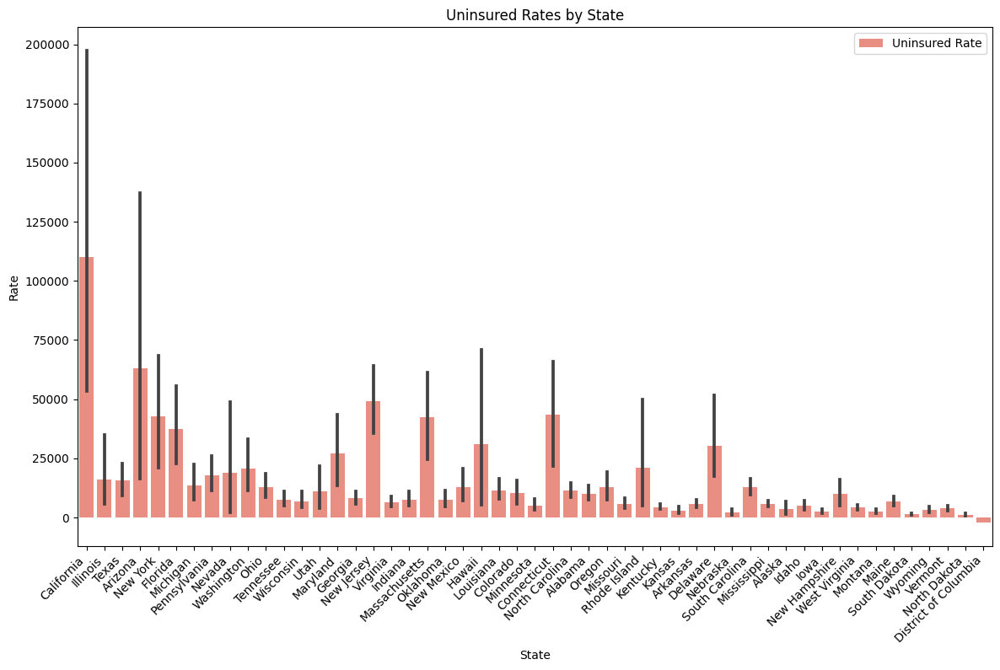

In [64]:
#Plotting a barplot (Uninsured State vs State) based on the 2nd Dataframe

plt.figure(figsize=(14, 8))
sns.barplot(x='State', y='Uninsured', data=Uninsured, color='salmon', label='Uninsured Rate')

plt.title('Uninsured Rates by State')
plt.xlabel('State')
plt.ylabel('Rate')
plt.xticks(rotation=45, ha='right')

# Show legend
plt.legend()

# Show the plot
plt.show()


This visualization exposes states with higher rates of uninsured population indicating gaps in insurance coverage.

Expansion Insights

●	Prioritize expansion into states with higher uninsured rates

●	Study drivers of uninsured population more in these states – age groups, employers etc

●	Craft campaigns to tap into this uninsured demand

●	Design competitively priced products to appeal to this consumer base


**visualisation 2**

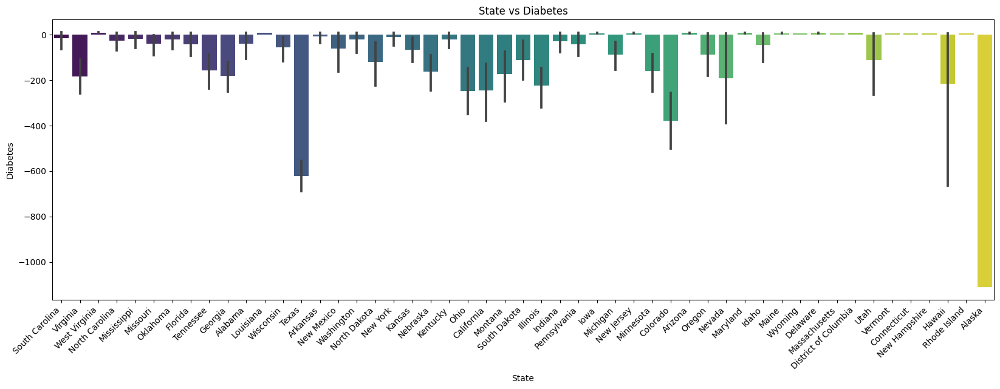

In [65]:
# Sort the DataFrame by 'Diabetes' in descending order
New_Uninsured = Uninsured.sort_values(by='Diabetes', ascending=False)

plt.figure(figsize=(20, 6))

# Bar chart with explicit order of states
sns.barplot(x='State', y='Diabetes', data=New_Uninsured, palette='viridis')

plt.title('State vs Diabetes')
plt.xlabel('State')
plt.ylabel('Diabetes')
plt.xticks(rotation=45, ha='right')
# Show the plot
plt.show()


The visualization here shows correlations like linkages between diabetes burden and uninsured population.

Expansion Insights

●	Positive correlations like above indicate higher disease burden driving need for insurance

●	Use heatmap insights to profile states on health needs to anticipate coverage costs

●	Set premiums accordingly based on expected health costs


In [66]:
New_Uninsured.columns

Index(['Diabetes', 'Uninsured', 'Elderly_Medicare', 'State_FIPS_Code',
       'County_FIPS_Code', 'County', 'State', 'Prim_Care_Phys_Rate'],
      dtype='object')

In [67]:
import pandas as pd


# Define aggregation methods for each column
aggregation_dict = {
    'Diabetes':'mean',
    'Uninsured':'mean',
    'Elderly_Medicare':'mean',
    'Prim_Care_Phys_Rate':'mean'
}
columns_to_drop = ['State_FIPS_Code','County_FIPS_Code']
New_Uninsured = New_Uninsured.drop(columns=columns_to_drop, errors='ignore')
New_Uninsured.replace(-1111.1, np.nan, inplace=True)
# Group by 'State' and apply the aggregation
New_Uninsured = New_Uninsured.groupby('State').agg(aggregation_dict).reset_index()

# Display the result
print(New_Uninsured)


                   State   Diabetes      Uninsured  Elderly_Medicare  \
0                Alabama   9.651563    9946.925373       8486.253731   
1                 Alaska        NaN    3608.777778       1113.925926   
2                Arizona   7.700000   63148.733333      41848.533333   
3               Arkansas   8.177027    5683.586667       4830.213333   
4             California   6.642222  110164.724138      61300.465517   
5               Colorado   4.283333   10226.687500       6517.718750   
6            Connecticut   5.987500   43486.250000      57259.000000   
7               Delaware   8.000000   30153.000000      33950.000000   
8   District of Columbia   7.800000   -2222.000000      63403.000000   
9                Florida   8.545312   37420.835821      38174.268657   
10               Georgia   8.661364    8061.113208       4938.383648   
11                Hawaii   6.650000   31111.800000      30957.600000   
12                 Idaho   6.414286    4876.227273       3422.34

# Data Merging
The 4 datasets are merged twice:

Merge 1: Dataset 1 (demographics) + Dataset 2 (health/insurance data) merged on county/state to get county-level population and outcome metrics


# Merged Data Frame (1 and 2 datasets)

In [68]:
merged_dataframe = pd.merge(New_demographics, New_Uninsured, on='State', how='inner')
merged_dataframe

,State,Population,Pop_Density,Poverty,Age_Under_19,Age_19_64,Age_65_84,Age_Over_85,White,Black,Hispanic,Diabetes,Uninsured,Elderly_Medicare,Prim_Care_Phys_Rate
0,Alabama,4557808,5736,1144.7,1689.5,4063.9,835.7,112.0,4676.3,1910.2,141.0,9.651563,9946.925373,8486.253731,49.758209
1,Alaska,663661,213,327.9,795.1,1718.6,170.1,16.0,1471.1,31.7,99.1,NaN,3608.777778,1113.925926,62.070370
2,Arizona,5939292,714,252.6,422.2,847.8,205.6,24.3,1216.3,28.3,418.2,7.700000,63148.733333,41848.533333,52.840000
3,Arkansas,2779154,3877,1334.5,1866.1,4469.7,1011.5,152.4,6156.4,1193.5,275.7,8.177027,5683.586667,4830.213333,52.068000
4,California,36132147,36531,746.4,1505.6,3564.9,630.2,100.4,4935.0,210.3,1461.5,6.642222,110164.724138,61300.465517,78.529310
5,Colorado,4665177,4873,748.3,1558.4,4027.5,707.3,106.2,6091.8,93.3,1117.1,4.283333,10226.687500,6517.718750,68.381250
6,Connecticut,3510297,5669,56.5,196.2,499.0,86.1,18.8,710.4,54.4,61.3,5.987500,43486.250000,57259.000000,97.075000
7,Delaware,843524,1659,28.8,72.8,183.8,37.9,5.3,229.5,58.6,16.1,8.000000,30153.000000,33950.000000,70.466667
8,District of Columbia,550521,8966,17.5,21.5,66.3,10.5,1.8,38.0,57.0,8.4,7.800000,-2222.000000,63403.000000,227.600000
9,Florida,17789864,21282,925.4,1546.7,4014.3,1008.5,131.1,5542.1,963.1,701.7,8.545312,37420.835821,38174.268657,56.174627


# Dataset 3 Uninsured rates by state loaded from URL to Excel file

In [69]:
#Importing File 3 and reading it
file_name = 'https://aspe.hhs.gov/sites/default/files/migrated_legacy_files//200101/aspe-uninsured-estimates-by-county.xlsx'
sheets_to_read = ['All Uninsured (#)']
df3 = pd.read_excel(file_name,sheets_to_read)


In [70]:
for sheet_name, df in df3.items():
    print(f"{sheet_name} Info:")
    df.info()
    print(df.columns)
    print("\n")

All Uninsured (#) Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3142 entries, 0 to 3141
Data columns (total 49 columns):
 #   Column                                                 Non-Null Count  Dtype  
---  ------                                                 --------------  -----  
 0   State Name                                             3142 non-null   object 
 1   FIPS Code                                              3142 non-null   int64  
 2   County Name                                            3142 non-null   object 
 3   Total Non-Elderly Population (Excluding Undocumented)  3142 non-null   int64  
 4   Uninsured Population (Excluding Undocumented)          3142 non-null   int64  
 5   Percent Uninsured                                      3142 non-null   float64
 6   HIU Income < 100% FPL                                  3142 non-null   object 
 7   HIU Income 100-138% FPL                                3142 non-null   object 
 8   HIU Income 139-249% FPL 

**Data Transformation of Dataset 3**

In [71]:
columns_to_keep = ['State Name', 'FIPS Code', 'County Name',
       'Total Non-Elderly Population (Excluding Undocumented)',
       'Uninsured Population (Excluding Undocumented)','Percent Uninsured',
                   'HIU Income < 100% FPL','HIU Income 100-138% FPL','HIU Income 139-249% FPL','HIU Income 250-400% FPL','HIU Income 400% FPL', 'Age 0-18', 'Age 19-34', 'Age 35-49',
                    'Age 50-64','With a disability', 'Full-time Worker in Family']

Non_Elderly_Population=df3['All Uninsured (#)'][columns_to_keep]


In [72]:
Non_Elderly_Population.head()

,State Name,FIPS Code,County Name,Total Non-Elderly Population (Excluding Undocumented),Uninsured Population (Excluding Undocumented),Percent Uninsured,HIU Income < 100% FPL,HIU Income 100-138% FPL,HIU Income 139-249% FPL,HIU Income 250-400% FPL,HIU Income 400% FPL,Age 0-18,Age 19-34,Age 35-49,Age 50-64,With a disability,Full-time Worker in Family
0,Alabama,1001,Autauga AL,46000,4300,0.094047,2300,700,600,500,300,200,1600,1500,1100,900,2600
1,Alabama,1003,Baldwin AL,171200,15600,0.091068,7000,1800,2400,2200,2100,1000,6100,4000,4500,800,12000
2,Alabama,1005,Barbour AL,22100,2700,0.120872,1200,300,500,600,100,100,1300,800,400,100,2100
3,Alabama,1007,Bibb AL,16800,2700,0.160059,1400,400,300,300,300,100,1500,700,400,300,1700
4,Alabama,1009,Blount AL,49500,6400,0.128740,3500,600,700,900,600,500,2600,2300,1000,900,3700


In [73]:
# Columns Kept Previously
columns_to_keep = ['State Name', 'FIPS Code', 'County Name',
       'Total Non-Elderly Population (Excluding Undocumented)',
       'Uninsured Population (Excluding Undocumented)','Percent Uninsured',
                   'HIU Income < 100% FPL','HIU Income 100-138% FPL','HIU Income 139-249% FPL','HIU Income 250-400% FPL','HIU Income 400% FPL', 'Age 0-18', 'Age 19-34', 'Age 35-49',
                    'Age 50-64','With a disability', 'Full-time Worker in Family']

new_names = {'County_Name':'County','State Name':'State',
             'Total Non-Elderly Population (Excluding Undocumented)':'Total Non-Elderly Population',
             'Uninsured Population (Excluding Undocumented)':'Uninsured Population'}


Non_Elderly_Population = Non_Elderly_Population.rename(columns=new_names)

# Print new column names
print(Non_Elderly_Population.columns)

Index(['State', 'FIPS Code', 'County Name', 'Total Non-Elderly Population',
       'Uninsured Population', 'Percent Uninsured', 'HIU Income < 100% FPL',
       'HIU Income 100-138% FPL', 'HIU Income 139-249% FPL',
       'HIU Income 250-400% FPL', 'HIU Income 400% FPL', 'Age 0-18',
       'Age 19-34', 'Age 35-49', 'Age 50-64', 'With a disability',
       'Full-time Worker in Family'],
      dtype='object')


In [74]:
Non_Elderly_Population = Non_Elderly_Population.sort_values(by=['Uninsured Population'], ascending=[False])
Non_Elderly_Population

,State,FIPS Code,County Name,Total Non-Elderly Population,Uninsured Population,Percent Uninsured,HIU Income < 100% FPL,HIU Income 100-138% FPL,HIU Income 139-249% FPL,HIU Income 250-400% FPL,HIU Income 400% FPL,Age 0-18,Age 19-34,Age 35-49,Age 50-64,With a disability,Full-time Worker in Family
2622,Texas,48201,Harris TX,3859700,804500,0.214473,255400,90800,217400,145100,95900,166900,303700,209500,124300,51300,673500
204,California,6037,Los Angeles CA,8076500,719200,0.089509,209800,67100,200600,133600,108100,88200,294200,188100,148800,35200,591000
2578,Texas,48113,Dallas TX,2118600,453600,0.214846,130800,59200,148500,68200,47000,106400,168900,109200,69200,30600,380700
103,Arizona,4013,Maricopa AZ,3613100,403500,0.112120,106200,33100,120800,86100,57100,90000,147900,96400,69200,26200,343000
609,Illinois,17031,Cook IL,4127600,353200,0.085848,118900,30100,86500,55400,62300,50000,139300,93700,70100,23900,277500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1657,Nebraska,31009,Blaine NE,300,0,0.119236,0,0,0,0,0,0,0,0,0,0,0
1711,Nebraska,31117,McPherson NE,400,0,0.116384,0,0,0,0,0,0,0,0,0,0,0
1631,Montana,30069,Petroleum MT,400,0,0.087754,0,0,0,0,0,0,0,0,0,0,0
2672,Texas,48301,Loving TX,100,0,0.244459,0,0,0,0,0,0,0,0,0,0,0


**Visualizations of Dataset 3**

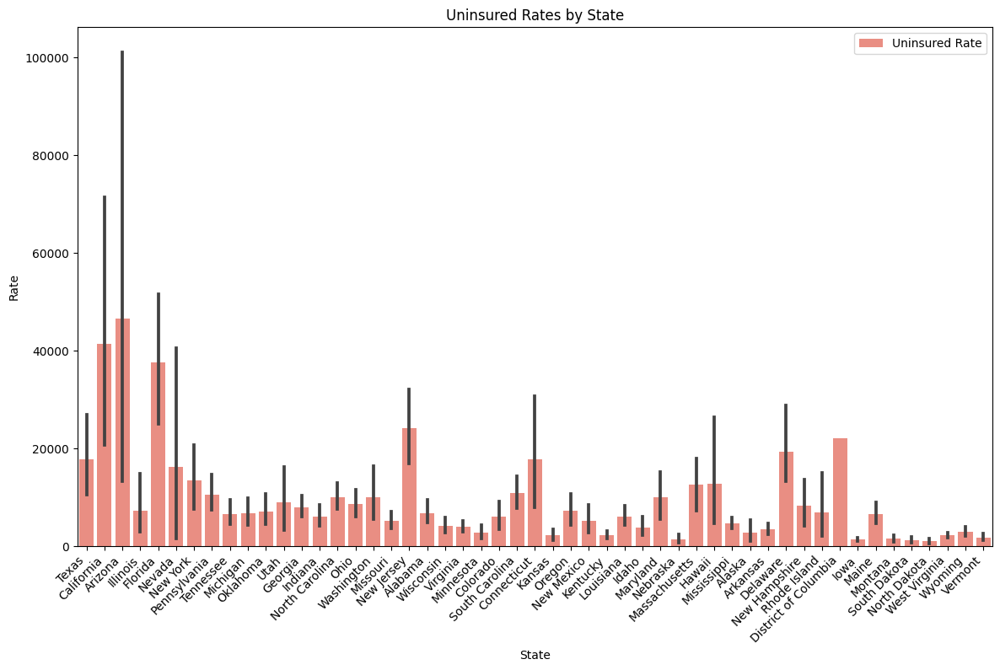

In [75]:
#Plotting a barplot (Uninsured State vs State) based on the 3rd Dataframe
plt.figure(figsize=(14, 8))
sns.barplot(x='State', y='Uninsured Population', data=Non_Elderly_Population, color='salmon', label='Uninsured Rate')
plt.title('Uninsured Rates by State')
plt.xlabel('State')
plt.ylabel('Rate')
plt.xticks(rotation=45, ha='right')

# Show legend
plt.legend()

# Show the plot
plt.show()

The uninsured rates in the various states are represented visually by the bar chart. Every bar represents a state, and the height of the bar represents the state's uninsured population.

The bars are highlighted in a salmon color, which facilitates comparison and identification of uninsured rates.

The graph makes it easy to compare the rates of uninsured people in different states and gives information about how healthcare coverage varies by area.

The rate of people without insurance is the depicted variable, as the legend makes clear.Readability is improved by the state labels rotating, particularly when a high number of states are involved.

In [76]:
# Group by 'State' and sum the values for each state
columns_to_drop = ['FIPS Code']
Non_Elderly_Population = Non_Elderly_Population.drop(columns=columns_to_drop, errors='ignore')
Non_Elderly_Population = Non_Elderly_Population.groupby('State').sum().reset_index()

# Display the merged dataframe
Non_Elderly_Population

<ipython-input-76-32b7ddfa5369>:4: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,State,Total Non-Elderly Population,Uninsured Population,Percent Uninsured,Age 35-49,Age 50-64,Full-time Worker in Family
0,Alabama,3986200,455900,8.734046,128700,102800,324000
1,Alaska,629600,80600,4.339249,16200,13100,66100
2,Arizona,5721000,698900,2.200210,166900,133300,554900
3,Arkansas,2443700,257000,8.266445,72400,48000,200800
4,California,32060800,2397800,4.935970,623600,480200,1889400
5,Colorado,4758900,392900,7.106251,103100,68600,330000
6,Connecticut,2794900,142100,0.371033,36700,32600,118300
7,Delaware,757200,57800,0.255681,11900,12500,42600
8,District of Columbia,601300,22100,0.033998,5200,3200,14800
9,Florida,16240800,2519600,12.777354,716600,573000,1948600


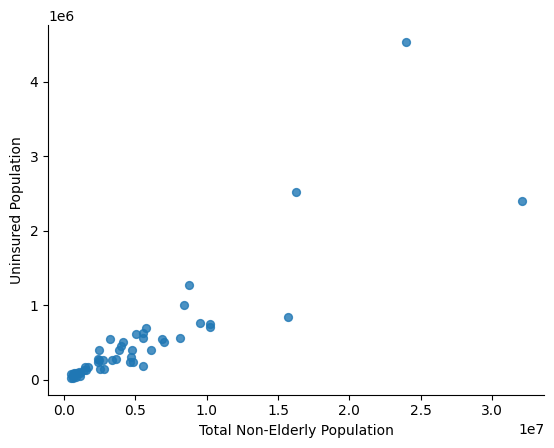

In [77]:
from matplotlib import pyplot as plt
_df_5.plot(kind='scatter', x='Total Non-Elderly Population', y='Uninsured Population', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

The relationship between the uninsured population and the total non-elderly population is depicted in the scatter plot.With the y-axis representing the uninsured population and the x-axis representing the total number of non-elderly people, each point on the plot represents a distinct observation.

In order to improve visual clarity, the top and right spines have been removed.This helps to draw attention to the data points and makes it easier to understand how the two variables are correlated.

# Dataset 4 Poverty rates by state loaded from URL to Excel file

In [78]:
#Importing file 4
file_name = 'https://www.ers.usda.gov/webdocs/DataFiles/48747/PovertyEstimates.xlsx?v=9662.9'
df4 = pd.read_excel(file_name)

In [79]:
df4

,"Poverty estimates for U.S., States, and counties, 2021",Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 24,Unnamed: 25,Unnamed: 26,Unnamed: 27,Unnamed: 28,Unnamed: 29,Unnamed: 30,Unnamed: 31,Unnamed: 32,Unnamed: 33
0,"Source: U.S. Department of Commerce, Bureau of...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"For definitions of rural classifications, see ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"This table was prepared by USDA, Economic Rese...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,FIPS_Code,Stabr,Area_name,Rural-urban_Continuum_Code_2003,Urban_Influence_Code_2003,Rural-urban_Continuum_Code_2013,Urban_Influence_Code_ 2013,POVALL_2021,CI90LBALL_2021,CI90UBALL_2021,...,CI90UB517P_2021,MEDHHINC_2021,CI90LBINC_2021,CI90UBINC_2021,POV04_2021,CI90LB04_2021,CI90UB04_2021,PCTPOV04_2021,CI90LB04P_2021,CI90UB04P_2021
4,00000,US,United States,NaN,NaN,NaN,NaN,41393176,41149497,41636855,...,16.3,69717,69583,69851,3349149,3299669,3398629,18.3,18,18.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3194,56037,WY,Sweetwater County,5,8,5,8,3761,3048,4474,...,11.5,74677,66928,82426,NaN,NaN,NaN,NaN,NaN,NaN
3195,56039,WY,Teton County,7,8,7,8,1392,1070,1714,...,6.4,102709,90132,115286,NaN,NaN,NaN,NaN,NaN,NaN
3196,56041,WY,Uinta County,7,8,7,8,1917,1457,2377,...,12.9,70162,62206,78118,NaN,NaN,NaN,NaN,NaN,NaN
3197,56043,WY,Washakie County,7,11,7,11,773,579,967,...,15.6,62176,55415,68937,NaN,NaN,NaN,NaN,NaN,NaN


**Data Transformation, aggregation and Data Visualisation of Dataset 4**

In [80]:
df4 = df4.iloc[3:]

# Set the values from the fourth row as column names
df4.columns = df4.iloc[0]

# Reset the index after skipping rows
df4 = df4.reset_index(drop=True)

# Drop the first row since it's now redundant
df4 = df4.drop(index=0)


In [81]:
df4.info()
df4.columns

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3195 entries, 1 to 3195
Data columns (total 34 columns):
 #   Column                           Non-Null Count  Dtype 
---  ------                           --------------  ----- 
 0   FIPS_Code                        3195 non-null   object
 1   Stabr                            3195 non-null   object
 2   Area_name                        3195 non-null   object
 3   Rural-urban_Continuum_Code_2003  3136 non-null   object
 4   Urban_Influence_Code_2003        3136 non-null   object
 5   Rural-urban_Continuum_Code_2013  3141 non-null   object
 6   Urban_Influence_Code_ 2013       3141 non-null   object
 7   POVALL_2021                      3194 non-null   object
 8   CI90LBALL_2021                   3194 non-null   object
 9   CI90UBALL_2021                   3194 non-null   object
 10  PCTPOVALL_2021                   3194 non-null   object
 11  CI90LBALLP_2021                  3194 non-null   object
 12  CI90UBALLP_2021                  3

Index(['FIPS_Code', 'Stabr', 'Area_name', 'Rural-urban_Continuum_Code_2003',
       'Urban_Influence_Code_2003', 'Rural-urban_Continuum_Code_2013',
       'Urban_Influence_Code_ 2013', 'POVALL_2021', 'CI90LBALL_2021',
       'CI90UBALL_2021', 'PCTPOVALL_2021', 'CI90LBALLP_2021',
       'CI90UBALLP_2021', 'POV017_2021', 'CI90LB017_2021', 'CI90UB017_2021',
       'PCTPOV017_2021', 'CI90LB017P_2021', 'CI90UB017P_2021', 'POV517_2021',
       'CI90LB517_2021', 'CI90UB517_2021', 'PCTPOV517_2021', 'CI90LB517P_2021',
       'CI90UB517P_2021', 'MEDHHINC_2021', 'CI90LBINC_2021', 'CI90UBINC_2021',
       'POV04_2021', 'CI90LB04_2021', 'CI90UB04_2021', 'PCTPOV04_2021',
       'CI90LB04P_2021', 'CI90UB04P_2021'],
      dtype='object', name=3)

In [82]:
columns_to_keep = ['FIPS_Code', 'Stabr', 'Area_name', 'POVALL_2021', 'PCTPOVALL_2021', 'POV017_2021', 'PCTPOV017_2021']
Child_Poverty=df4[columns_to_keep]


In [83]:
Child_Poverty

3,FIPS_Code,Stabr,Area_name,POVALL_2021,PCTPOVALL_2021,POV017_2021,PCTPOV017_2021
1,00000,US,United States,41393176,12.8,12243219,16.9
2,01000,AL,Alabama,800848,16.3,250327,22.7
3,01001,AL,Autauga County,6296,10.7,2199,16.1
4,01003,AL,Baldwin County,25526,10.8,8207,16.4
5,01005,AL,Barbour County,5089,23,1776,35.1
...,...,...,...,...,...,...,...
3191,56037,WY,Sweetwater County,3761,9.2,990,9.7
3192,56039,WY,Teton County,1392,5.9,223,5.5
3193,56041,WY,Uinta County,1917,9.4,635,11.2
3194,56043,WY,Washakie County,773,10.2,195,12.5


In [84]:

# Create a mapping of state abbreviations to full names
state_mapping = {
    'AL': 'Alabama',
    'AK': 'Alaska',
    'AZ': 'Arizona',
    'AR': 'Arkansas',
    'CA': 'California',
    'CO': 'Colorado',
    'CT': 'Connecticut',
    'DE': 'Delaware',
    'FL': 'Florida',
    'GA': 'Georgia',
    'HI': 'Hawaii',
    'ID': 'Idaho',
    'IL': 'Illinois',
    'IN': 'Indiana',
    'IA': 'Iowa',
    'KS': 'Kansas',
    'KY': 'Kentucky',
    'LA': 'Louisiana',
    'ME': 'Maine',
    'MD': 'Maryland',
    'MA': 'Massachusetts',
    'MI': 'Michigan',
    'MN': 'Minnesota',
    'MS': 'Mississippi',
    'MO': 'Missouri',
    'MT': 'Montana',
    'NE': 'Nebraska',
    'NV': 'Nevada',
    'NH': 'New Hampshire',
    'NJ': 'New Jersey',
    'NM': 'New Mexico',
    'NY': 'New York',
    'NC': 'North Carolina',
    'ND': 'North Dakota',
    'OH': 'Ohio',
    'OK': 'Oklahoma',
    'OR': 'Oregon',
    'PA': 'Pennsylvania',
    'RI': 'Rhode Island',
    'SC': 'South Carolina',
    'SD': 'South Dakota',
    'TN': 'Tennessee',
    'TX': 'Texas',
    'UT': 'Utah',
    'VT': 'Vermont',
    'VA': 'Virginia',
    'WA': 'Washington',
    'WV': 'West Virginia',
    'WI': 'Wisconsin',
    'WY': 'Wyoming'
}

# Replace abbreviated state names with full names
Child_Poverty['Stabr'] = Child_Poverty['Stabr'].map(state_mapping)
Child_Poverty

<ipython-input-84-03a498316991>:56: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



3,FIPS_Code,Stabr,Area_name,POVALL_2021,PCTPOVALL_2021,POV017_2021,PCTPOV017_2021
1,00000,NaN,United States,41393176,12.8,12243219,16.9
2,01000,Alabama,Alabama,800848,16.3,250327,22.7
3,01001,Alabama,Autauga County,6296,10.7,2199,16.1
4,01003,Alabama,Baldwin County,25526,10.8,8207,16.4
5,01005,Alabama,Barbour County,5089,23,1776,35.1
...,...,...,...,...,...,...,...
3191,56037,Wyoming,Sweetwater County,3761,9.2,990,9.7
3192,56039,Wyoming,Teton County,1392,5.9,223,5.5
3193,56041,Wyoming,Uinta County,1917,9.4,635,11.2
3194,56043,Wyoming,Washakie County,773,10.2,195,12.5


In [85]:
columns_to_keep=['Stabr','POVALL_2021','PCTPOVALL_2021','POV017_2021','PCTPOV017_2021']
new_names={'Stabr':'State','POVALL_2021':'Poverty Rate','PCTPOVALL_2021':'Poverty %','POV017_2021':'Child Poverty','PCTPOV017_2021':'Child Poverty %'}

Child_Poverty = Child_Poverty.rename(columns=new_names)

# Print new column names
print(Child_Poverty.columns)

Index(['FIPS_Code', 'State', 'Area_name', 'Poverty Rate', 'Poverty %',
       'Child Poverty', 'Child Poverty %'],
      dtype='object', name=3)


In [86]:
# Define aggregation methods for each column
aggregation_dict = {
    'Poverty %':'mean',
    'Child Poverty %':'mean',
    'Poverty Rate':'sum',
    'Child Poverty':'sum'
}
columns_to_drop = ['FIPS_Code','Area_name']
Child_Poverty = Child_Poverty.drop(columns=columns_to_drop, errors='ignore')
# Group by 'State' and apply the aggregation
Child_Poverty = Child_Poverty.groupby('State').agg(aggregation_dict).reset_index()

# Display the result
print(Child_Poverty)

3            State  Poverty %  Child Poverty % Poverty Rate Child Poverty
0          Alabama  19.408824        27.886765      1601693        500656
1           Alaska  13.654839        17.535484       155473         47519
2          Arizona  17.000000        23.762500      1839360        563392
3         Arkansas  18.714474        26.498684       942393        300701
4       California  13.608475        17.583051      9484809       2725805
5         Colorado  12.523077        16.944615      1108251        288325
6      Connecticut   9.844444        12.200000       711722        186525
7         Delaware  11.650000        16.850000       226052         66603
8          Florida  15.552941        22.450000      5661633       1549358
9          Georgia  18.396250        26.961875      2987671       1017237
10          Hawaii  11.640000        14.340000       305312         76583
11           Idaho  11.944444        15.553333       404184        115154
12        Illinois  12.798058        1

In [87]:
# Assuming 'State' and 'Poverty' are the column names in your merged_dataframe
fig = px.bar(Child_Poverty, x='State', y='Child Poverty', title=' Child Poverty by State',
             labels={'Child Poverty': 'Child Poverty Rate', 'State': 'State'},
             color='Child Poverty', color_continuous_scale="Viridis")

# Customize the layout if needed
fig.update_layout(xaxis_title='State', yaxis_title='Child Poverty Rate')

# Show the plot
fig.show()

The bar chart shows the state-by-state rates of child poverty,with each bar denoting the rate for a particular state.The intensity of the color gives an extra dimension that shows how high the poverty rates are.

The visual representation facilitates clear state-to-state comparisons, leading to a better understanding of the distribution of child poverty.

Merge 2: Merge 1 + Dataset 3 (uninsured rates) + Dataset 4 (poverty rates) merged on state to consolidate state-level metrics relevant for expansion planning

### Merged data frame 2( Merged Data frame 1 and Dataset 3)

In [88]:
merged_dataframe2 = pd.merge(Non_Elderly_Population, Child_Poverty, on='State', how='inner')
merged_dataframe2

,State,Total Non-Elderly Population,Uninsured Population,Percent Uninsured,Age 35-49,Age 50-64,Full-time Worker in Family,Poverty %,Child Poverty %,Poverty Rate,Child Poverty
0,Alabama,3986200,455900,8.734046,128700,102800,324000,19.408824,27.886765,1601693,500656
1,Alaska,629600,80600,4.339249,16200,13100,66100,13.654839,17.535484,155473,47519
2,Arizona,5721000,698900,2.200210,166900,133300,554900,17.000000,23.762500,1839360,563392
3,Arkansas,2443700,257000,8.266445,72400,48000,200800,18.714474,26.498684,942393,300701
4,California,32060800,2397800,4.935970,623600,480200,1889400,13.608475,17.583051,9484809,2725805
5,Colorado,4758900,392900,7.106251,103100,68600,330000,12.523077,16.944615,1108251,288325
6,Connecticut,2794900,142100,0.371033,36700,32600,118300,9.844444,12.200000,711722,186525
7,Delaware,757200,57800,0.255681,11900,12500,42600,11.650000,16.850000,226052,66603
8,Florida,16240800,2519600,12.777354,716600,573000,1948600,15.552941,22.450000,5661633,1549358
9,Georgia,8745000,1268400,29.284073,347700,243900,942700,18.396250,26.961875,2987671,1017237


## Merged Data frame 3 ( Merged data frame 2 and Dataset 4)

In [89]:
merged_dataframe3 = pd.merge(merged_dataframe, merged_dataframe2, on='State', how='inner')
merged_dataframe3

,State,Population,Pop_Density,Poverty,Age_Under_19,Age_19_64,Age_65_84,Age_Over_85,White,Black,...,Total Non-Elderly Population,Uninsured Population,Percent Uninsured,Age 35-49,Age 50-64,Full-time Worker in Family,Poverty %,Child Poverty %,Poverty Rate,Child Poverty
0,Alabama,4557808,5736,1144.7,1689.5,4063.9,835.7,112.0,4676.3,1910.2,...,3986200,455900,8.734046,128700,102800,324000,19.408824,27.886765,1601693,500656
1,Alaska,663661,213,327.9,795.1,1718.6,170.1,16.0,1471.1,31.7,...,629600,80600,4.339249,16200,13100,66100,13.654839,17.535484,155473,47519
2,Arizona,5939292,714,252.6,422.2,847.8,205.6,24.3,1216.3,28.3,...,5721000,698900,2.200210,166900,133300,554900,17.000000,23.762500,1839360,563392
3,Arkansas,2779154,3877,1334.5,1866.1,4469.7,1011.5,152.4,6156.4,1193.5,...,2443700,257000,8.266445,72400,48000,200800,18.714474,26.498684,942393,300701
4,California,36132147,36531,746.4,1505.6,3564.9,630.2,100.4,4935.0,210.3,...,32060800,2397800,4.935970,623600,480200,1889400,13.608475,17.583051,9484809,2725805
5,Colorado,4665177,4873,748.3,1558.4,4027.5,707.3,106.2,6091.8,93.3,...,4758900,392900,7.106251,103100,68600,330000,12.523077,16.944615,1108251,288325
6,Connecticut,3510297,5669,56.5,196.2,499.0,86.1,18.8,710.4,54.4,...,2794900,142100,0.371033,36700,32600,118300,9.844444,12.200000,711722,186525
7,Delaware,843524,1659,28.8,72.8,183.8,37.9,5.3,229.5,58.6,...,757200,57800,0.255681,11900,12500,42600,11.650000,16.850000,226052,66603
8,Florida,17789864,21282,925.4,1546.7,4014.3,1008.5,131.1,5542.1,963.1,...,16240800,2519600,12.777354,716600,573000,1948600,15.552941,22.450000,5661633,1549358
9,Georgia,9072576,28683,2550.5,4229.2,9746.8,1692.7,231.5,11164.8,4449.1,...,8745000,1268400,29.284073,347700,243900,942700,18.396250,26.961875,2987671,1017237


In [90]:
merged_dataframe3.columns

Index(['State', 'Population', 'Pop_Density', 'Poverty', 'Age_Under_19',
       'Age_19_64', 'Age_65_84', 'Age_Over_85', 'White', 'Black', 'Hispanic',
       'Diabetes', 'Uninsured', 'Elderly_Medicare', 'Prim_Care_Phys_Rate',
       'Total Non-Elderly Population', 'Uninsured Population',
       'Percent Uninsured', 'Age 35-49', 'Age 50-64',
       'Full-time Worker in Family', 'Poverty %', 'Child Poverty %',
       'Poverty Rate', 'Child Poverty'],
      dtype='object')

## **Visualisations of Final dataset(merged_dataframe3)**

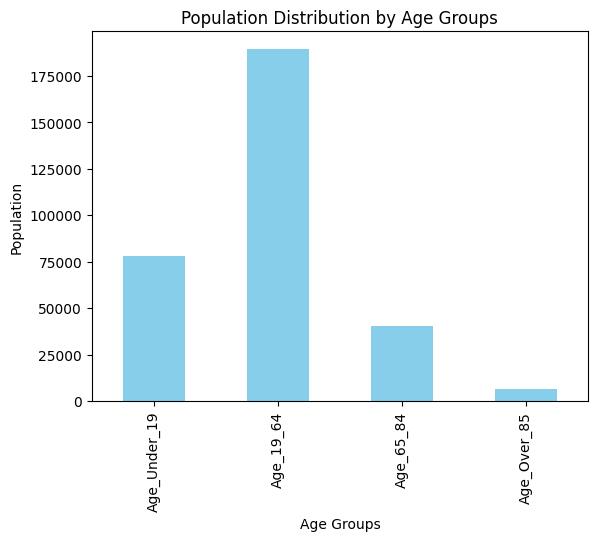

In [91]:
import matplotlib.pyplot as plt

# Extract relevant columns
age_columns = ['Age_Under_19', 'Age_19_64', 'Age_65_84', 'Age_Over_85']
age_distribution = merged_dataframe3[age_columns]

# Plot
age_distribution.sum().plot(kind='bar', color='skyblue')
plt.title('Population Distribution by Age Groups')
plt.xlabel('Age Groups')
plt.ylabel('Population')
plt.show()


The above bar chart visually represents the population distribution across different age groups. Each bar corresponds to a specific age group ('Under 19', '19-64', '65-84', 'Over 85'), and the height of each bar indicates the total population in that age category. The chart provides a clear overview of how the population is distributed across various age ranges, allowing for easy comparison between different age groups.

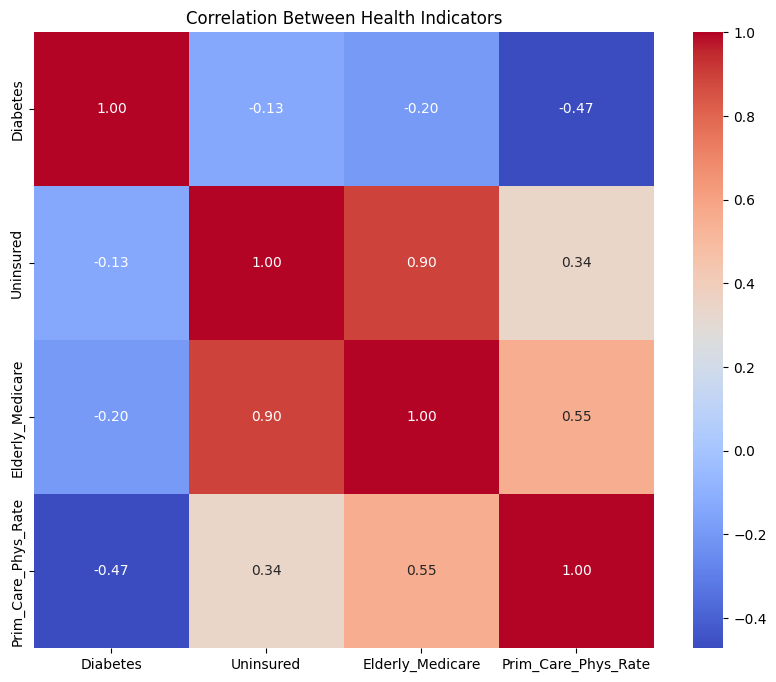

In [92]:
import seaborn as sns

# Extract relevant columns
health_columns = ['Diabetes', 'Uninsured', 'Elderly_Medicare', 'Prim_Care_Phys_Rate']
health_data = merged_dataframe3[health_columns]

# Calculate correlation matrix
correlation_matrix = health_data.corr()

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Between Health Indicators')
plt.show()


The above map represents the correlation between different health indicators. Each square in the map corresponds to the correlation coefficient between two health indicators, and the color intensity indicates the strength and direction of the correlation.

The color map 'coolwarm' is used to represent the strength of correlation. Positive correlations are typically shown in warm colors (red), while negative correlations are shown in cool colors (blue).

The numbers inside each square are the correlation coefficients. These values range from -1 to 1, where -1 indicates a perfect negative correlation, 1 indicates a perfect positive correlation, and 0 indicates no correlation.

Insights-

strong positive correlations suggest that as one health indicator increases, the other tends to increase as well, and vice versa for negative correlations.

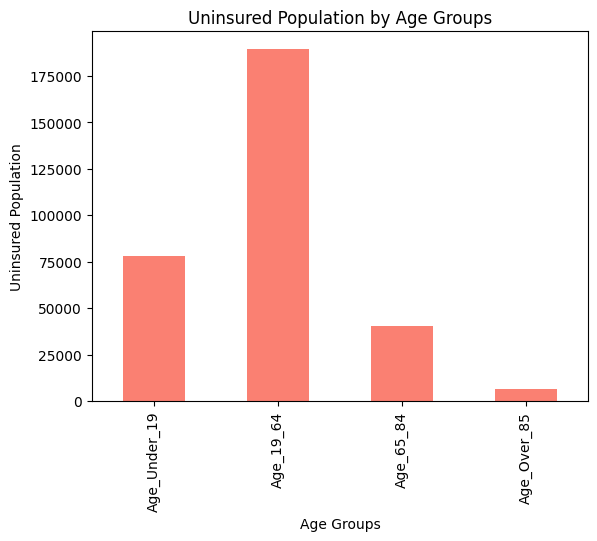

In [93]:
# Extract relevant columns
uninsured_columns = ['Age_Under_19', 'Age_19_64', 'Age_65_84', 'Age_Over_85']
uninsured_population = merged_dataframe3[uninsured_columns]

# Plot
uninsured_population.sum().plot(kind='bar', color='salmon')
plt.title('Uninsured Population by Age Groups')
plt.xlabel('Age Groups')
plt.ylabel('Uninsured Population')
plt.show()


The distribution of the uninsured population across various age groups is shown graphically in the above bar chart. 'Under 19', '19-64', '65-84', and 'Over 85' are the age groups that each bar represents,among them age groups '19-64' are more.

# **Conclusion**


**key insights from this analysis to inform the health insurance expansion strategy:**

Through the compilation and analysis of relevant demographic, health, and socioeconomic datasets, this project has profiled states across factors such as:

Population size and insurance coverage gaps indicating market demand
Disease prevalence and correlations driving medical cost risks
Poverty rates reflecting socioeconomic barriers to affordable healthcare access

**Key Insights Gained:**

States like Texas, Florida and North Carolina present large underserved markets based on their uninsured rates combined with large populations
Focusing on high poverty states to increase insurance access for socioeconomically disadvantaged groups could have significant social impact
Age distribution skewed towards low elderly population allows for focused product design centered on chronic diseases and preventive care
Correlations between disease burden and uninsured rates allows premiums to be set accordingly

**Recommendations:**
Prioritize expansion into states like Texas, Florida and North Carolina offering biggest large market opportunities

Design a new affordable product suite focused on cost-conscious consumer segments in high poverty states

Partner with large national employers in top expansion states to offer competitive group insurance rates to tap into young uninsured workforce
Set premium levels based on expected costs linked to state-specific disease burdens and demographics

In conclusion, the multivariate state-level analysis has provided data-driven direction across target market selection, product development, pricing and sales strategies - significantly de-risking the geographic expansion planning for the health insurance company. The analytical approach presented could also serve as framework for expansion planning for healthcare companies in other sectors.
